In [1]:
import os
import anndata

import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

sc.settings.verbosity = 2           # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=90, facecolor='white')
np.random.seed(0)

scanpy==1.9.2 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==1.5.3 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.10.4 pynndescent==0.5.8


In [2]:
### Seurat style colormap
colors = ["magenta", "k", "yellow"]
seurat_style = LinearSegmentedColormap.from_list("seurat", colors)

In [3]:
plot_color = ['#B68136', '#A5FCA1', '#14B0A7', '#E1E79F', '#E78A5D', '#A64FB9', '#997CA4', '#4D14C3', '#F03132', '#DA3E89', '#9865E8', '#54ABBD', '#D1B2C1', '#B4788E', '#9BD87C', '#73A2ED', '#D1AEB6', '#52EE6F', '#0C8CBF', '#7DA2E2']

In [4]:
fig5path = './output_files_testXR/'
if not os.path.exists(fig5path):
    os.makedirs(fig5path)
spatial_aspect = 7/11

### Loading data

In [5]:
# cbm_file = "./input_files/cellbits_matrix_mean_inten.zip"
cbm_file = "./input_files/Fig5_cell_bit_intensity_mat.csv"
meta_file = "./input_files/Fig5_cells_positions.csv"
cells_meta = pd.read_csv(meta_file, index_col = 0)
cbm = pd.read_csv(cbm_file, index_col=0)

display(cbm)
display(cells_meta)
display(cells_meta['QC'].value_counts())


,M40,M37,M15,M47,M53,M21,M09,M34,M22,M49,...,M35,M31,M30,M24,M38,M39,M10,M26,M16,M08
0,55.294118,117.658824,49.270588,91.211765,95.435294,1523.835294,188.200000,685.176471,3490.058824,265.447059,...,582.188235,563.258824,2566.305882,1818.552941,104.564706,174.670588,65.011765,571.494118,36.788235,111.541176
1,10.584906,25.396226,8.716981,23.830189,11.622642,39.660377,3.226415,60.603774,268.226415,14.452830,...,532.962264,43.018868,76.132075,295.264151,18.094340,15.773585,4.226415,915.811321,4.811321,2.075472
2,27.150000,1082.216667,15.116667,7.383333,5.650000,115.933333,5.133333,31.583333,66.850000,5.816667,...,32.100000,34.150000,157.500000,77.066667,14.683333,10.916667,2.850000,62.950000,4.750000,0.716667
3,34.267241,1701.353448,17.517241,16.155172,29.655172,162.198276,5.413793,32.224138,60.172414,14.568966,...,43.000000,34.870690,146.120690,113.034483,14.362069,23.784483,4.008621,85.844828,3.896552,2.603448
4,67.293333,850.493333,5.960000,255.440000,181.573333,374.986667,50.546667,118.733333,635.306667,26.946667,...,165.426667,70.640000,302.106667,115.880000,23.786667,82.613333,5.826667,126.080000,3.493333,4.880000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56347,27.040230,1849.408046,17.626437,84.913793,146.793103,255.402299,74.609195,100.678161,308.770115,58.109195,...,313.522989,351.522989,2584.787356,464.683908,68.350575,87.747126,16.959770,458.114943,14.505747,13.873563
56348,49.674074,968.051852,11.555556,78.644444,92.311111,111.466667,33.822222,143.962963,336.977778,21.259259,...,43.525926,28.362963,167.451852,141.177778,40.533333,79.614815,14.570370,88.466667,11.600000,6.925926
56349,26.243590,254.564103,10.576923,29.833333,73.692308,87.102564,32.756410,171.500000,200.038462,32.089744,...,34.333333,41.564103,199.910256,539.564103,60.551282,83.615385,12.884615,58.487179,8.384615,6.487179
56350,35.562500,494.468750,11.531250,311.906250,297.500000,143.031250,131.093750,378.781250,875.781250,24.468750,...,38.187500,34.250000,201.968750,190.062500,22.562500,85.625000,13.656250,127.125000,8.093750,3.968750


,x,y,leiden,QC
0,8670.835294,12770.305880,13,cell
1,7887.358491,13559.679250,7,cell
2,6411.150000,12702.433330,6,cell
3,6473.422414,12705.620690,3,cell
4,6685.226667,12703.000000,28,cell
...,...,...,...,...
56347,6250.522989,1264.034483,9,cell
56348,5606.659259,1264.325926,20,cell
56349,5464.730769,1266.589744,22,cell
56350,5897.812500,1268.093750,20,cell


cell    56096
lowq      143
Name: QC, dtype: int64

In [6]:
cells_meta = cells_meta[cells_meta['QC'] != 'lowq'] 
cbm = cbm.loc[cells_meta.index.to_list(),:]

print(cells_meta.shape, cbm.shape)

(56096, 4) (56096, 53)


#### Filter cells with high expression across >30 modules

,x,y,leiden,QC
0,8670.835294,12770.305880,13,cell
932,5172.469697,13358.469700,4,cell
1076,6074.665188,13567.004430,24,cell
1442,4929.518987,12883.894510,4,cell
1539,4639.836957,13107.275360,7,cell
...,...,...,...,...
56287,5987.407534,1111.945205,2,cell
56288,6090.383333,1115.772222,2,cell
56299,6111.675214,1131.034188,2,cell
56303,6126.366548,1143.459075,2,cell


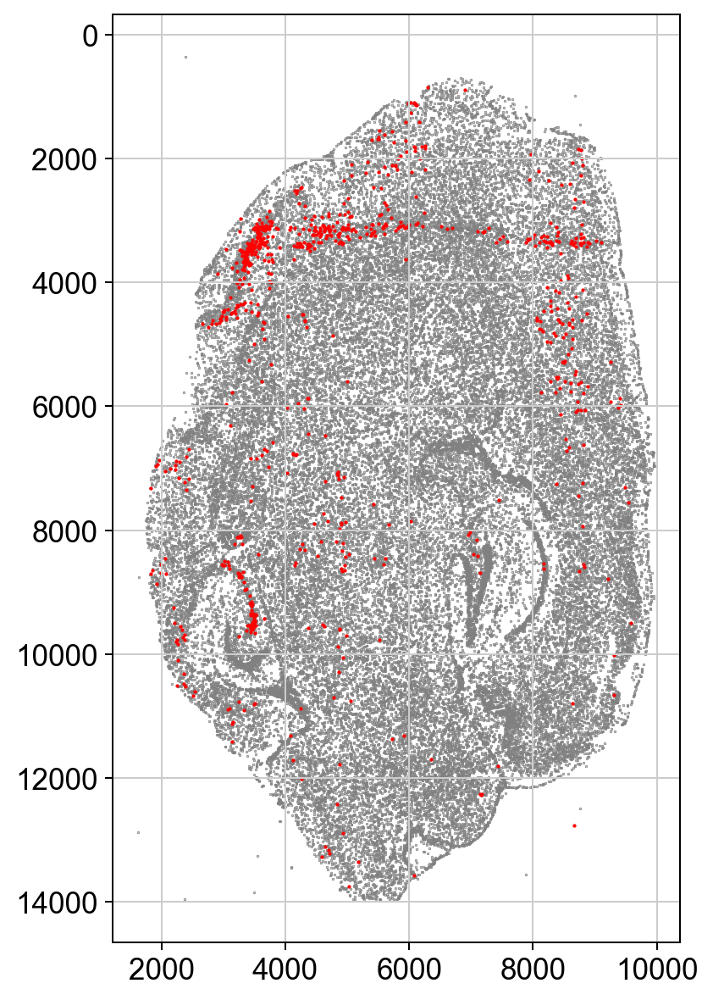

In [7]:
cutoff = np.percentile(cbm, 98, axis=0)
highexpr_in_n_modules = (cbm>cutoff).sum(axis=1)
suspicious_cells = cells_meta.loc[highexpr_in_n_modules>10, :]
display(suspicious_cells)
# plt.hist(highexpr_in_n_modules, bins=20)

plt.figure(figsize=(8,8))
plt.scatter(cells_meta.loc[:,"x"], cells_meta.loc[:, "y"], s = 0.1, c ='gray')
plt.scatter(suspicious_cells.loc[:,"x"], suspicious_cells.loc[:, "y"], s = 0.5, c = 'red')
plt.gca().set_aspect("equal")
plt.gca().invert_yaxis()

In [8]:
# Do the filtering
cbm = cbm[~cbm.index.isin(suspicious_cells.index)]
cells_meta = cells_meta[~cells_meta.index.isin(suspicious_cells.index)]
print(cells_meta.shape, cbm.shape)

(55305, 4) (55305, 53)


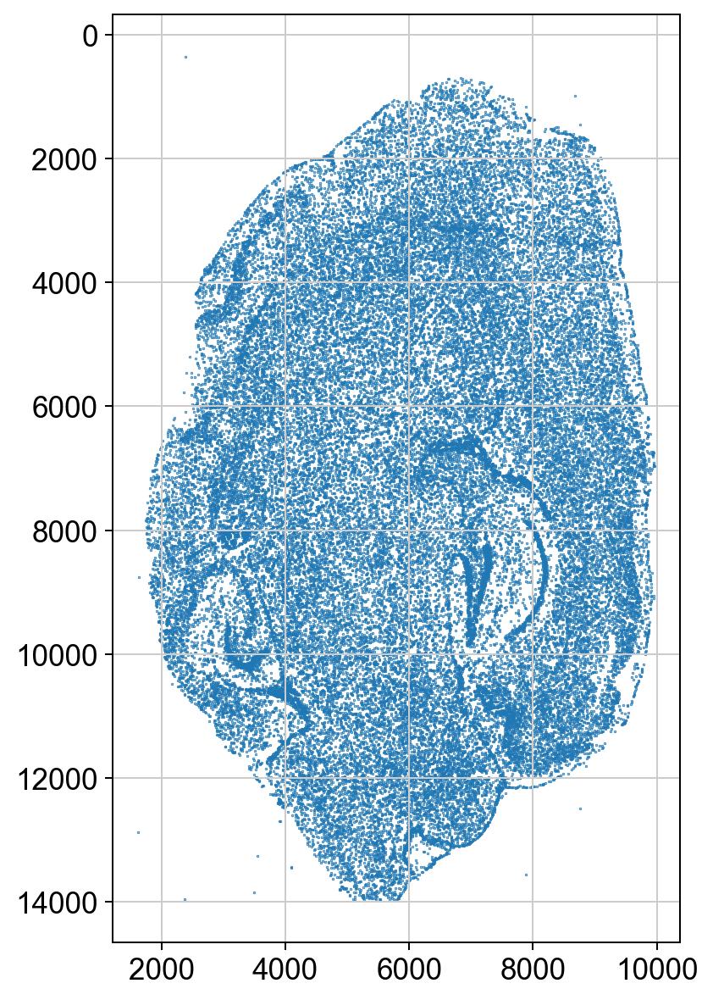

In [9]:
plt.figure(figsize=(8,8))
plt.scatter(cells_meta.loc[:,"x"], cells_meta.loc[:, "y"], s = 0.1)
plt.gca().set_aspect("equal")
plt.gca().invert_yaxis()

,x,y,leiden,QC
926,5614.473684,13352.047850,4,cell
1428,4826.044118,12861.676470,4,cell
1450,4853.080000,12900.074290,4,cell
1594,4713.255556,13240.611110,4,cell
1602,4711.144330,13251.000000,4,cell
...,...,...,...,...
55741,8396.232653,2275.575510,2,cell
55783,7937.610000,2338.400000,2,cell
56054,6581.252830,928.562264,2,cell
56252,6319.231132,860.400943,14,cell


(54834, 4) (54834, 53)


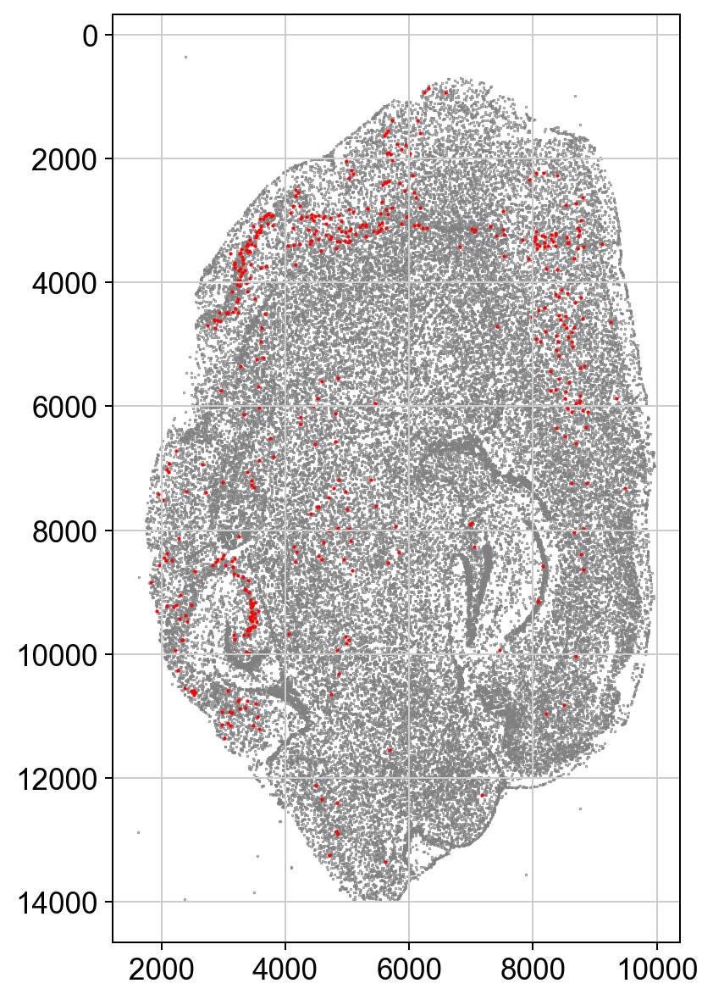

In [10]:
### Filter cells with high expression across >30 modules
cutoff = np.percentile(cbm, 98, axis=0)
highexpr_in_n_modules = (cbm>cutoff).sum(axis=1)
suspicious_cells = cells_meta.loc[highexpr_in_n_modules>10, :]
display(suspicious_cells)

# Visualize suspicious cells in red
plt.figure(figsize=(8,8))
plt.scatter(cells_meta.loc[:,"x"], cells_meta.loc[:, "y"], s = 0.1, c ='gray')
plt.scatter(suspicious_cells.loc[:,"x"], suspicious_cells.loc[:, "y"], s = 0.5, c = 'red')
plt.gca().set_aspect("equal")
plt.gca().invert_yaxis()

# Do filtering
cbm = cbm[~cbm.index.isin(suspicious_cells.index)]
cells_meta = cells_meta[~cells_meta.index.isin(suspicious_cells.index)]
print(cells_meta.shape, cbm.shape)

### Clustering

In [11]:
adata = sc.AnnData(cbm, dtype=np.float32)
adata.obs = cells_meta
adata.var_names_make_unique() 
print(adata.obs)

                 x             y  leiden    QC
1      7887.358491  13559.679250       7  cell
2      6411.150000  12702.433330       6  cell
3      6473.422414  12705.620690       3  cell
4      6685.226667  12703.000000      28  cell
5      6696.637500  12704.762500       4  cell
...            ...           ...     ...   ...
56347  6250.522989   1264.034483       9  cell
56348  5606.659259   1264.325926      20  cell
56349  5464.730769   1266.589744      22  cell
56350  5897.812500   1268.093750      20  cell
56351  2386.581081    354.770270      21  cell

[54834 rows x 4 columns]


C:\Users\Xinrui\anaconda3\lib\site-packages\anndata\_core\anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
C:\Users\Xinrui\anaconda3\lib\site-packages\anndata\_core\anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [1, 2, 3, 4, 5]

    Inferred to be: integer

  value_idx = self._prep_dim_index(value.index, attr)


normalizing counts per cell
    finished (0:00:00)


C:\Users\Xinrui\anaconda3\lib\site-packages\seaborn\categorical.py:82: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  plot_data = [np.asarray(s, float) for k, s in iter_data]


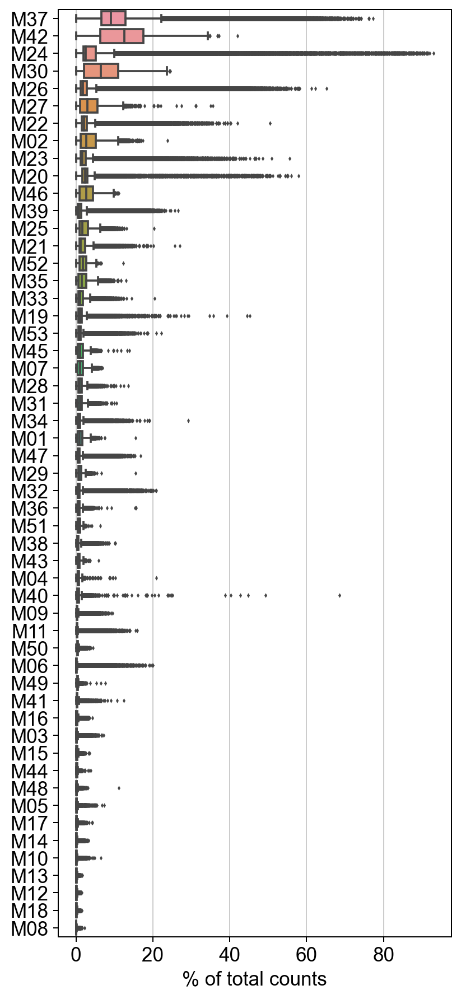

C:\Users\Xinrui\anaconda3\lib\site-packages\anndata\_core\anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [12]:
sc.pl.highest_expr_genes(adata, n_top=cbm.shape[1], )
sc.pp.filter_cells(adata, min_genes=0)
sc.pp.filter_genes(adata, min_cells=0)

In [13]:
sc.pp.normalize_total(adata, target_sum=1e4, key_added = 'normalize_total')
sc.pp.log1p(adata, copy = False)
sc.pp.scale(adata, zero_center = True, max_value=10, copy=False, layer=None, )

normalizing counts per cell
    finished (0:00:00)


### Clustering

In [14]:
clusters_idv_ids_fn = os.path.join(fig5path, 'Clustermap_idv_ids.pdf')
clusters_idv_names_fn = os.path.join(fig5path, 'Clustermap_idv_names.pdf')
clusters_fused_fn = os.path.join(fig5path, 'Clustermap_fused.pdf')
clusters_fused_names_fn = os.path.join(fig5path, 'Clustermap_fused_names.pdf')
adata_fn = os.path.join(fig5path, 'Fig5_mouseBrain_10xFISHnCHIPs.h5ad')
umap_ids_fn = os.path.join(fig5path, 'UMAP_ids.pdf')
heatmap_ids_fn = os.path.join(fig5path, 'Heatmap_ids.pdf')

In [15]:
n_neighbors = 15
n_pcs = 20
res = 0.6

sc.tl.pca(adata, svd_solver='arpack', use_highly_variable=False, n_comps=50, zero_center =True)
sc.pp.neighbors(adata, n_neighbors=n_neighbors, n_pcs=n_pcs, knn=True, method='umap', metric='euclidean')
sc.tl.leiden(adata, resolution=res)

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished (0:00:21)
running Leiden clustering
    finished (0:00:08)


18 clusters found!

{'0': '#B68136', '1': '#A5FCA1', '10': '#14B0A7', '11': '#E1E79F', '12': '#E78A5D', '13': '#A64FB9', '14': '#997CA4', '15': '#4D14C3', '16': '#F03132', '17': '#DA3E89', '2': '#9865E8', '3': '#54ABBD', '4': '#D1B2C1', '5': '#B4788E', '6': '#9BD87C', '7': '#73A2ED', '8': '#D1AEB6', '9': '#52EE6F'}


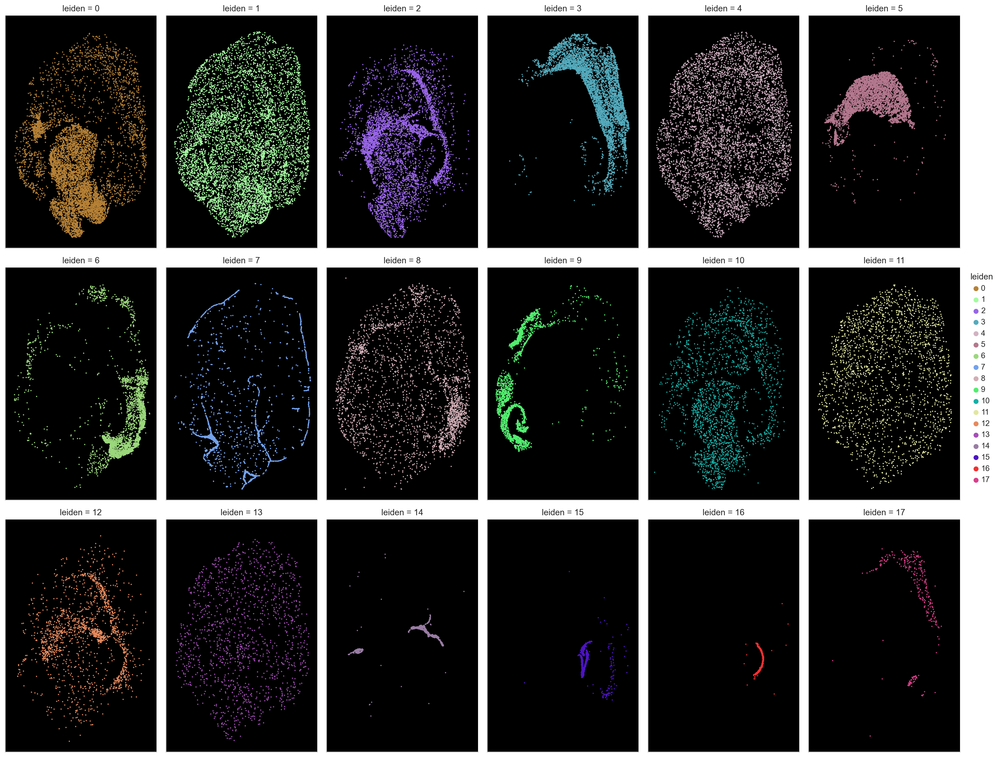

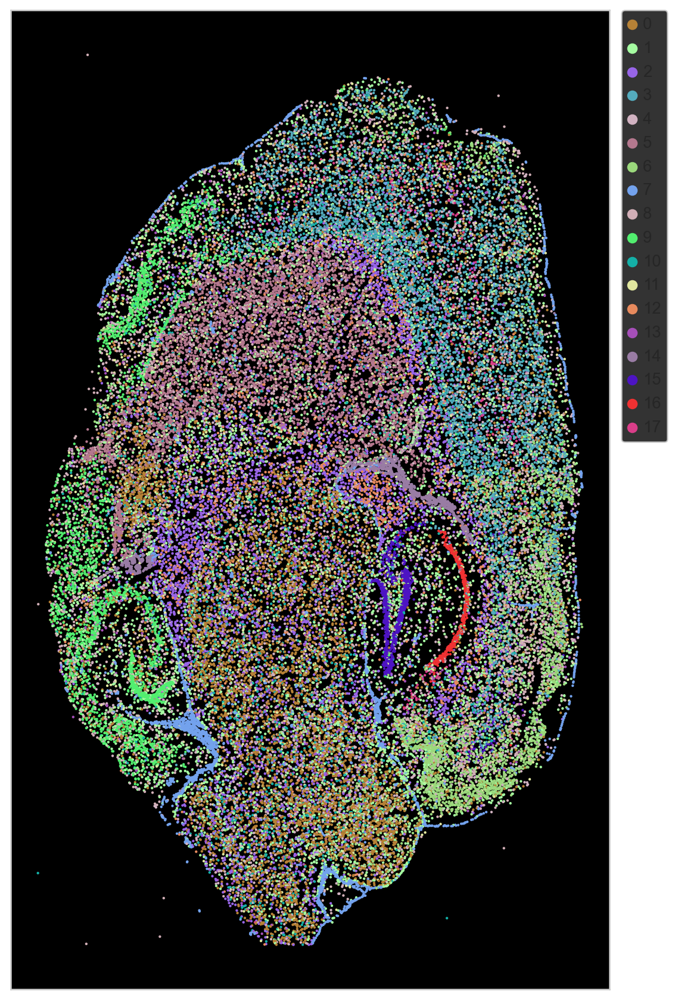

In [16]:
# Plot clusters
cluster_name = 'leiden'

adata.obs[cluster_name] = adata.obs[cluster_name].astype('category')
cluster_order = np.unique(adata.obs.loc[:,cluster_name]) 
n_cluster=len(cluster_order)
color_map_cluster = {cluster_order[i]: plot_color[i] for i in range(len(cluster_order))}
print('%i clusters found!\n' % n_cluster)
print(color_map_cluster)

sns.set(rc={'axes.facecolor':'black', 'axes.grid': False, 'axes.axisbelow': False, 
            "xtick.labelbottom": False, 'ytick.labelleft': False, 
            'axes.linewidth': 1.0, 'axes.edgecolor': '.8'})
facet = sns.relplot(data=adata.obs, x="x", y="y",  palette=color_map_cluster,  col=cluster_name, hue=cluster_name,  
                    linewidth=0, col_wrap = 6, kind="scatter", s=3, aspect=spatial_aspect)
facet.fig.axes[0].invert_yaxis()
# plt.savefig(clusters_idv_ids_fn, bbox_inches='tight')


plt.figure(figsize=(12, 12))
sns.scatterplot(data = adata.obs, x = "x" , y = "y", s = 3, linewidth=0, hue= cluster_name, palette=color_map_cluster)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, ncol=1)
plt.gca().set_aspect("equal")
plt.gca().invert_yaxis()
# plt.savefig(clusters_idv_names_fn, bbox_inches='tight')

computing UMAP
    finished (0:00:27)


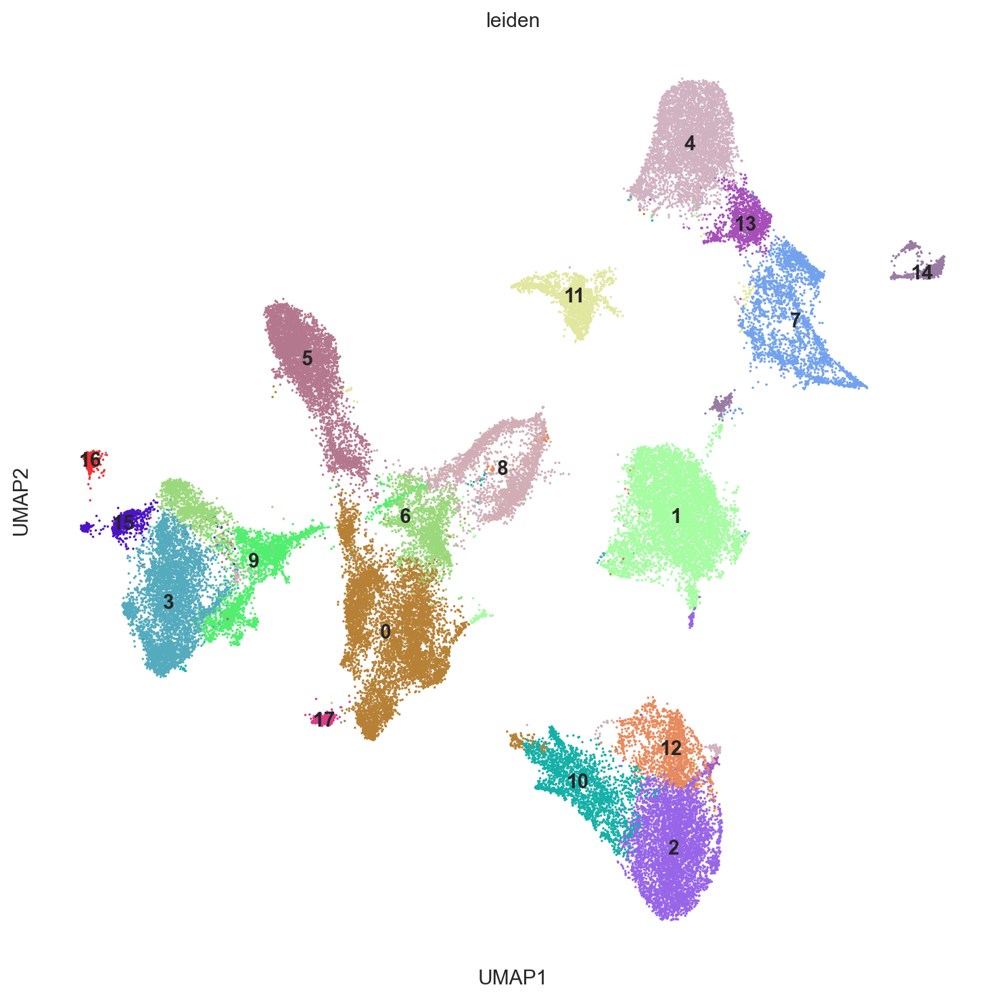

In [17]:
# Plot UMAP
min_dist = 0.1
layer = 'leiden'
sc.tl.umap(adata, min_dist=min_dist, spread=1, n_components=2, maxiter=None, init_pos='spectral', random_state=0, copy=False)
sns.set(rc={'axes.facecolor':'white', 'axes.grid': False, 'figure.figsize': (10,10)})
# sc.pl.umap(adata, color=layer, s=8, palette=color_map_cluster, legend_loc='on data', save='Fig5_UMAP_id.pdf')
sc.pl.umap(adata, color=layer, s=8, palette=color_map_cluster, legend_loc='on data')

    using 'X_pca' with n_pcs = 20
Storing dendrogram info using `.uns['dendrogram_leiden']`


C:\Users\Xinrui\anaconda3\lib\site-packages\scanpy\plotting\_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


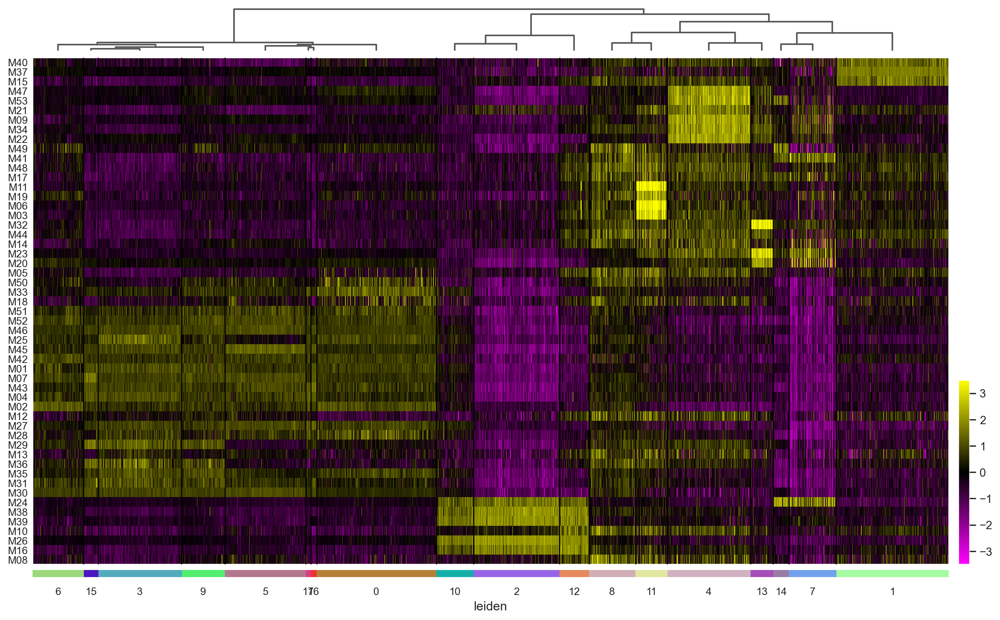

In [18]:
# Plot heatmap
sc.tl.dendrogram(adata, groupby='leiden', n_pcs = n_pcs, cor_method='pearson', linkage_method='complete', optimal_ordering=True)
sns.set(rc={'axes.facecolor':'white', 'axes.grid': False, 'axes.axisbelow': False, "xtick.labelbottom": True, 'ytick.labelleft': True, 'axes.linewidth': 1.0})
sc.pl.heatmap(adata, adata.var_names, groupby='leiden', swap_axes=True, cmap=seurat_style, dendrogram=True, vmin=-3.5, vmax=3.5,  show_gene_labels=True, figsize=(16, 10))

In [19]:
adata.write(adata_fn, compression='gzip')

### Rename clusters

#### Loading the clustering results

In [20]:
adata_fn = os.path.join(fig5path, 'Fig5_mouseBrain_10xFISHnCHIPs.h5ad')

adata = anndata.read(adata_fn)
display(adata)
display(adata.obs)
display(pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names))

leiden_ids = np.unique(adata.obs['leiden'])
print(leiden_ids)

AnnData object with n_obs × n_vars = 54834 × 53
    obs: 'x', 'y', 'leiden', 'QC', 'n_genes', 'normalize_total'
    var: 'n_cells', 'mean', 'std'
    uns: 'dendrogram_leiden', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

,x,y,leiden,QC,n_genes,normalize_total
1,7887.358491,13559.679250,10,cell,53,4985.189453
2,6411.150000,12702.433330,1,cell,53,2633.949951
3,6473.422414,12705.620690,1,cell,53,3883.879150
4,6685.226667,12703.000000,4,cell,53,6748.719727
5,6696.637500,12704.762500,0,cell,53,8492.500000
...,...,...,...,...,...,...
56347,6250.522989,1264.034483,6,cell,53,19507.751953
56348,5606.659259,1264.325926,13,cell,53,6758.881348
56349,5464.730769,1266.589744,7,cell,53,4381.282227
56350,5897.812500,1268.093750,13,cell,53,9357.312500


,M40,M37,M15,M47,M53,M21,M09,M34,M22,M49,...,M35,M31,M30,M24,M38,M39,M10,M26,M16,M08
1,-0.685691,-3.040047,0.015713,-0.360752,-1.929398,-0.892224,-1.407184,0.596070,1.049684,-0.423390,...,2.290736,-0.101613,-1.074441,0.453871,-0.266024,-0.995892,-0.501919,1.638302,-0.404232,-1.252461
2,1.100721,1.557079,1.504797,-0.942026,-2.039713,1.600714,-0.345733,0.578655,0.160566,-1.078502,...,-0.064162,0.463169,0.248176,-0.205916,0.200232,-0.771157,-0.165907,-0.041364,0.163777,-1.816001
3,0.922584,1.624441,1.198860,-0.512981,-0.328418,1.523858,-0.678153,0.112750,-0.422142,0.202291,...,-0.167727,-0.046713,-0.201445,-0.210896,-0.245879,-0.443682,-0.231542,-0.105561,-0.369810,-0.564285
4,1.062692,0.314687,-0.801775,1.934706,1.401032,1.941626,1.032206,1.065207,1.712502,0.354619,...,0.691696,0.165970,-0.032817,-0.703545,-0.297749,0.142018,-0.477113,-0.243606,-0.937429,-0.450291
5,0.318463,0.307173,-0.459689,0.631815,-0.127740,0.045705,-0.939245,-0.470986,0.494719,-0.042172,...,1.227338,1.054807,0.507613,-0.084020,-0.545144,-0.174205,-0.842030,-0.152641,-1.126340,-0.894513
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56347,-1.151868,0.015578,-0.775146,-0.463318,-0.348338,-0.169066,0.338190,-0.484735,-0.396904,-0.357825,...,0.234742,0.921181,1.021010,-0.398054,-0.304159,-0.702721,-0.467647,-0.055781,-0.632381,-0.475379
56348,0.713704,0.449172,-0.011816,0.621240,0.468091,0.167068,0.614709,1.308247,0.959441,-0.225949,...,-0.750311,-1.094440,-0.606360,-0.520725,0.279993,0.109371,0.817338,-0.535278,0.117939,0.086753
56349,0.480499,-0.498654,0.413829,0.028349,0.754278,0.439535,1.030351,2.083175,0.855252,1.844793,...,-0.539726,0.029603,-0.014284,1.139597,1.197121,0.519468,1.271731,-0.519149,0.218924,0.672141
56350,-0.035127,-0.598269,-0.408276,1.792874,1.631192,0.056398,1.684673,2.125953,1.705631,-0.672530,...,-1.237041,-1.281118,-0.739867,-0.546828,-0.705438,-0.104619,0.255669,-0.504778,-0.500855,-1.226649


['0' '1' '10' '11' '12' '13' '14' '15' '16' '17' '2' '3' '4' '5' '6' '7'
 '8' '9']


In [21]:
cbm_scaled = pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names)
cbm_scaled.to_csv(os.path.join(fig5path, 'Figure5_FISHnCHIPs0316_scaledMatrix.csv'))


C:\Users\Xinrui\anaconda3\lib\site-packages\scanpy\plotting\_anndata.py:2414: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  obs_tidy.index.value_counts(sort=False).iteritems()


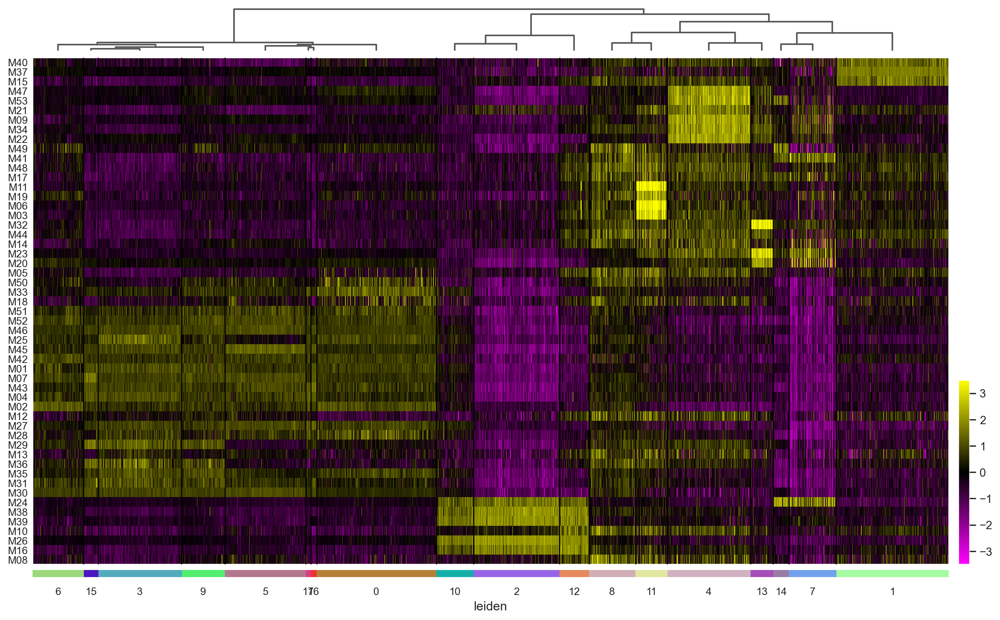

In [22]:
# Plot heatmap
sns.set(rc={'axes.facecolor':'white', 'axes.grid': False, 'axes.axisbelow': False, "xtick.labelbottom": True, 'ytick.labelleft': True, 'axes.linewidth': 1.0})
sc.pl.heatmap(adata, adata.var_names, groupby='leiden', swap_axes=True, cmap=seurat_style, dendrogram=True, vmin=-3.5, vmax=3.5,  show_gene_labels=True, figsize=(16, 10))

In [23]:
# Assign names
class_names = {
    '0': 'Inhibitory neurons 1',
    '1': 'Astrocytes',
    '2': 'Mature oligodendrocytes 1',
    '3': 'Excitatory neurons 1',
    '4': 'Endothelial cells',
    '5': 'Excitatory neurons 2',
    '6': 'Excitatory neurons 3',
    '7': 'Blood vessel associated cells',
    '8': 'Unknown',
    '9':  'Excitatory neurons 4',
    '10': 'Mature oligodendrocytes 2',
    '11': 'Microglia',
    '12': 'Immature oligodendrocytes',
    '13': 'Pericytes',
    '14': 'Ependymal cells',
    '15': 'Excitatory neurons 5',
    '16': 'Excitatory neurons 6',
    '17': 'Inhibitory neurons 2'
}

adata.obs['class'] = adata.obs['leiden'].map(class_names)

In [24]:
display(adata.obs)

,x,y,leiden,QC,n_genes,normalize_total,class
1,7887.358491,13559.679250,10,cell,53,4985.189453,Mature oligodendrocytes 2
2,6411.150000,12702.433330,1,cell,53,2633.949951,Astrocytes
3,6473.422414,12705.620690,1,cell,53,3883.879150,Astrocytes
4,6685.226667,12703.000000,4,cell,53,6748.719727,Endothelial cells
5,6696.637500,12704.762500,0,cell,53,8492.500000,Inhibitory neurons 1
...,...,...,...,...,...,...,...
56347,6250.522989,1264.034483,6,cell,53,19507.751953,Excitatory neurons 3
56348,5606.659259,1264.325926,13,cell,53,6758.881348,Pericytes
56349,5464.730769,1266.589744,7,cell,53,4381.282227,Blood vessel associated cells
56350,5897.812500,1268.093750,13,cell,53,9357.312500,Pericytes


In [25]:
adata.obs.to_csv(os.path.join(fig5path, 'cells_annotation.csv'))

In [26]:
# Plot clusters
layer = 'class'
n_cluster=len(np.unique(adata.obs[layer]))
print('%i clusters found!\n' % n_cluster)

cluster_order = np.unique(adata.obs.loc[:,layer])

# color_map_cluster = {cluster_order[i]: plot_color[i] for i in range(len(cluster_order))}
# print(color_map_cluster)
color_map_cluster = {
    'Astrocytes': '#F56867',
    'Blood vessel associated cells': '#ff478b',
    'Excitatory neurons 1': '#0095FF',
    'Excitatory neurons 2': '#ff9408',
    'Excitatory neurons 3': '#be03fd',
    'Excitatory neurons 4': '#009E73',
    'Excitatory neurons 5': '#ffff14',
    'Excitatory neurons 6': '#ee82ee',
    'Inhibitory neurons 2': '#aaff33',
    'Inhibitory neurons 1': '#b0c5ee',
    'Microglia': '#59BE86',
    'Pericytes': '#FF00AA',
    'Mature oligodendrocytes 1': '#ff000d',
    'Mature oligodendrocytes 2': '#1b6968',
    'Immature oligodendrocytes': '#fec848',
    'Ependymal cells':  '#21fc0d',
    'Endothelial cells': '#47ebe2' ,
    'Unknown': '#f7d1cf',
}

18 clusters found!



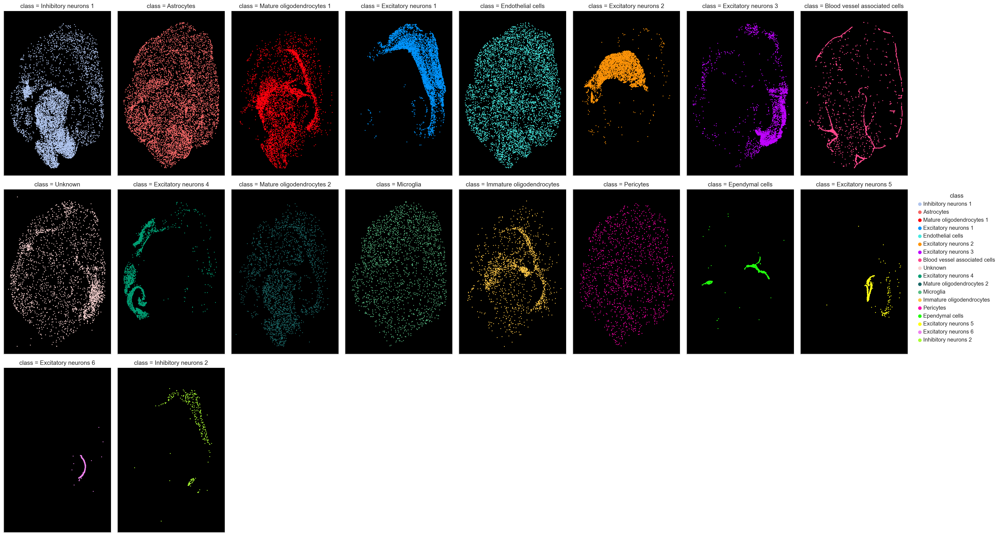

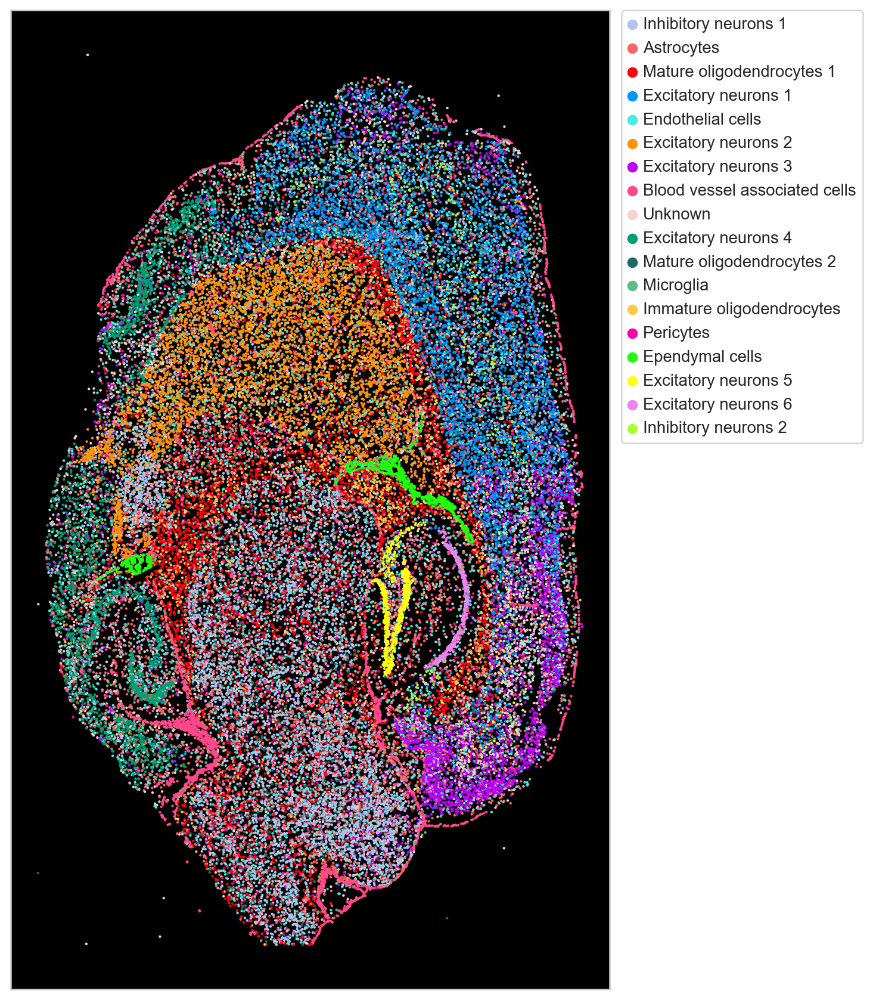

In [27]:
# Spatial
sns.set(rc={'axes.facecolor':'black', 'axes.grid': False, 'axes.axisbelow': False, 
            "xtick.labelbottom": False, 'ytick.labelleft': False, 
            'axes.linewidth': 1.0, 'axes.edgecolor': '.8'})

facet = sns.relplot(data=adata.obs, x="x", y="y", 
                    palette=color_map_cluster, 
                    col=layer, hue=layer, 
                    linewidth=0, col_wrap = 8, kind="scatter", 
                    s=3, aspect=spatial_aspect)
facet.fig.axes[0].invert_yaxis()
plt.savefig(clusters_idv_names_fn, bbox_inches='tight')

# Fused spatial
plt.figure(figsize=(12, 12))
sns.scatterplot(data = adata.obs, x = "x" , y = "y", s = 3, linewidth=0, hue= layer, palette=color_map_cluster)
plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0, ncol=1, facecolor='white')
plt.gca().set_aspect("equal")
plt.gca().invert_yaxis()
plt.savefig(clusters_fused_names_fn, bbox_inches='tight')


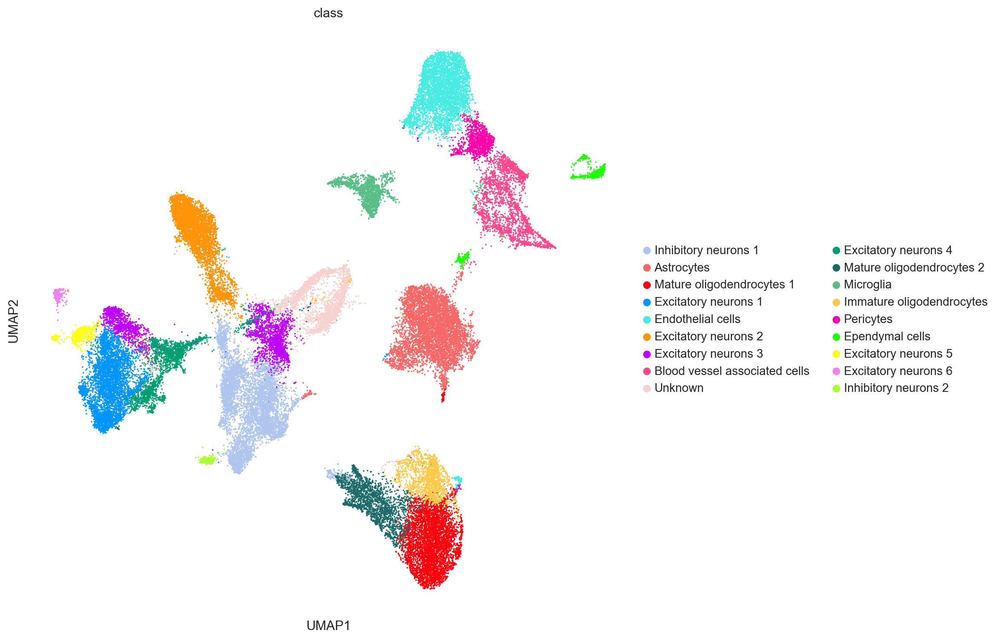

In [28]:
# Plot UMAP
sns.set(rc={'axes.facecolor':'white', 'axes.grid': False, 'figure.figsize': (10,10)})
sc.pl.umap(adata, color=layer, s=8, palette=color_map_cluster)

In [29]:
# Replot heatmap
from pandas.api.types import CategoricalDtype
from matplotlib.patches import Patch

cbm_plot = pd.DataFrame(adata.X, index=adata.obs_names, columns=adata.var_names)
cells_meta = adata.obs


C:\Users\Xinrui\AppData\Local\Temp\ipykernel_36884\1091199945.py:8: DeprecationWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  cells_meta.loc[:,layer] = cells_meta.loc[:,layer].astype(cat_cluster)


(54834, 7)
(54834, 53)


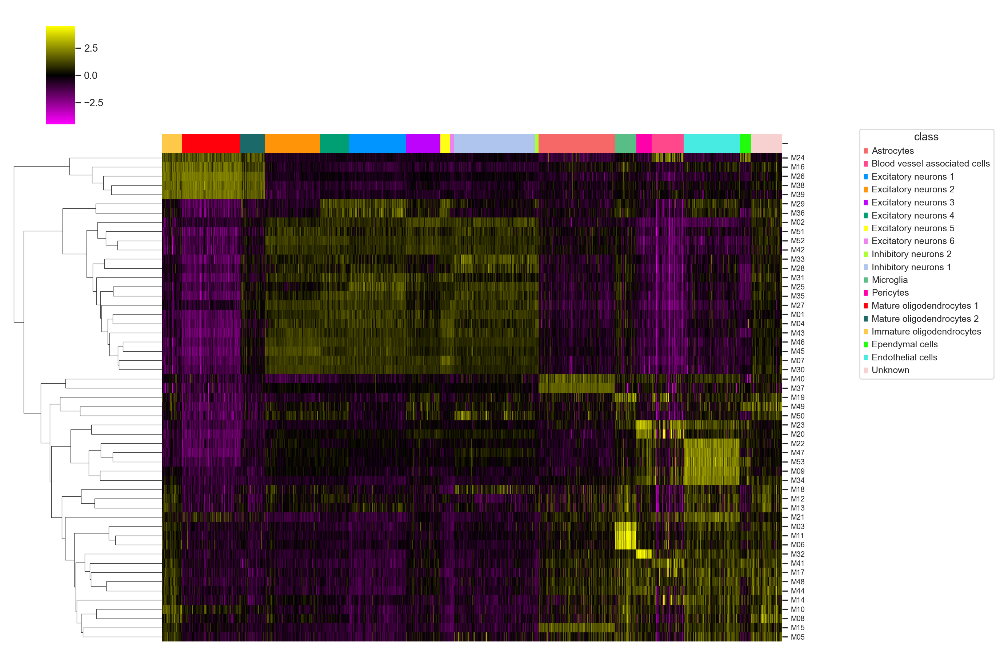

In [30]:
layer = 'class'
cluster_order = np.array(['Immature oligodendrocytes',  'Mature oligodendrocytes 1', 'Mature oligodendrocytes 2', 
                          'Excitatory neurons 2','Excitatory neurons 4', 'Excitatory neurons 1', 'Excitatory neurons 3',  
                          'Excitatory neurons 5', 'Excitatory neurons 6', 'Inhibitory neurons 1',  'Inhibitory neurons 2',
                          'Astrocytes',  'Microglia',  'Pericytes',  'Blood vessel associated cells', 
                          'Endothelial cells',  'Ependymal cells', 'Unknown'])
cat_cluster = CategoricalDtype(cluster_order, ordered=True)
cells_meta.loc[:,layer] = cells_meta.loc[:,layer].astype(cat_cluster)
cells_meta.index = cells_meta.index.astype(int)
cells_meta = cells_meta.sort_index()
cells_meta = cells_meta.sort_values(layer)
print(cells_meta.shape)

cbm_plot.index = cbm_plot.index.astype(int)
cbm_plot = cbm_plot.loc[cells_meta.index.to_list(),:]
print(cbm_plot.shape)

row_cb = cells_meta.loc[:,layer].map(color_map_cluster) 
g = sns.clustermap(cbm_plot.T, col_cluster=False, row_cluster=True, 
                   col_colors=row_cb, cmap=seurat_style, vmin=-4.5, vmax=4.5,  standard_scale=None, 
                   xticklabels=False, yticklabels=True, figsize=(15, 10))
g.ax_heatmap.tick_params(axis='y', which='major', labelsize=8, labelrotation=0)
g.fig.subplots_adjust(bottom=0.01, top=0.98, right=0.8, left=0.01)
g.ax_cbar.set_position((0.05, .8, .03, .15))

handles = [Patch(facecolor=color_map_cluster[name]) for name in color_map_cluster]
plt.legend(handles, color_map_cluster, title=layer, bbox_to_anchor=(1.02, 0.8), bbox_transform=plt.gcf().transFigure, loc='best', fontsize=10)
plt.savefig(os.path.join(fig5path, 'Heatmap_class_4o5.png'), bbox_inches='tight')

In [31]:
adata_fn = os.path.join(fig5path, 'Fig5_mouseBrain_10xFISHnCHIPs_anno.h5ad')
adata.write(adata_fn, compression='gzip')